In [1]:
import pandas as pd
from prophet import Prophet

## Quick Start

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_peyton_manning.csv')

df.tail()

,ds,y
2900,2016-01-16,7.817223
2901,2016-01-17,9.273878
2902,2016-01-18,10.333775
2903,2016-01-19,9.125871
2904,2016-01-20,8.891374


In [3]:
m = Prophet()
m.fit(df)

09:56:34 - cmdstanpy - INFO - Chain [1] start processing
09:56:35 - cmdstanpy - INFO - Chain [1] done processing


In [4]:
future = m.make_future_dataframe(periods=365)
future.tail()

,ds
3265,2017-01-15
3266,2017-01-16
3267,2017-01-17
3268,2017-01-18
3269,2017-01-19


In [5]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
3265,2017-01-15,8.206964,7.493806,8.969312
3266,2017-01-16,8.531958,7.823932,9.270802
3267,2017-01-17,8.319376,7.623495,9.090729
3268,2017-01-18,8.151991,7.434881,8.903159
3269,2017-01-19,8.163908,7.434761,8.909642


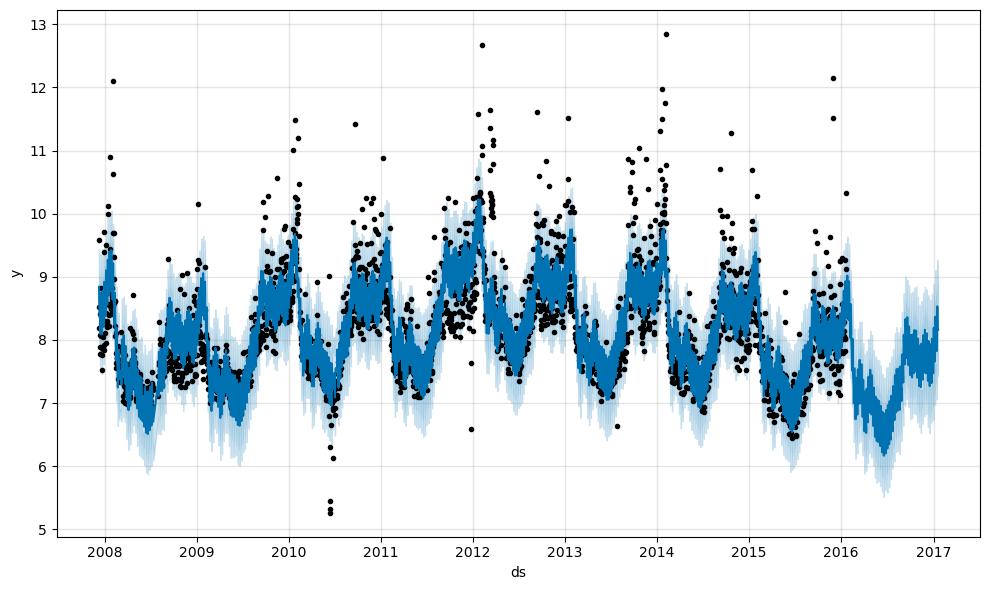

In [6]:
fig1=m.plot(forecast)

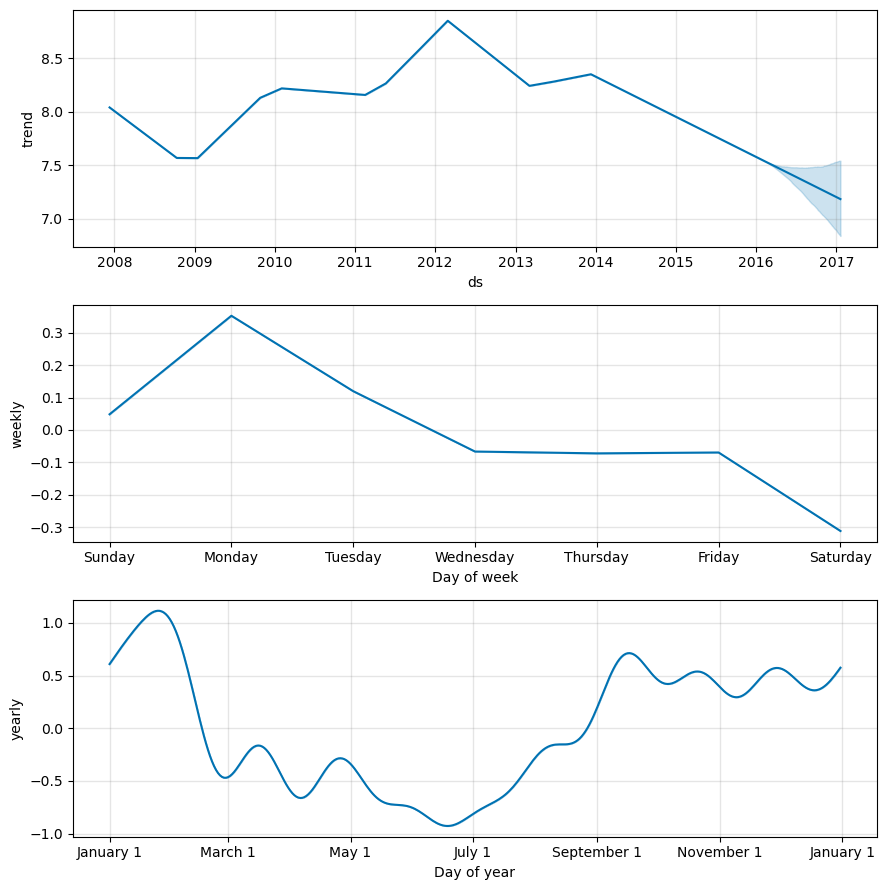

In [7]:
fig2 = m.plot_components(forecast)

In [8]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [9]:
plot_components_plotly(m, forecast)

## Saturating Forecasts

### Forecasting Growth

In [10]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_peyton_manning.csv')


In [11]:
df['cap'] = 8.5

In [12]:
m = Prophet(growth='logistic')
m.fit(df)

09:56:38 - cmdstanpy - INFO - Chain [1] start processing
09:56:38 - cmdstanpy - INFO - Chain [1] done processing


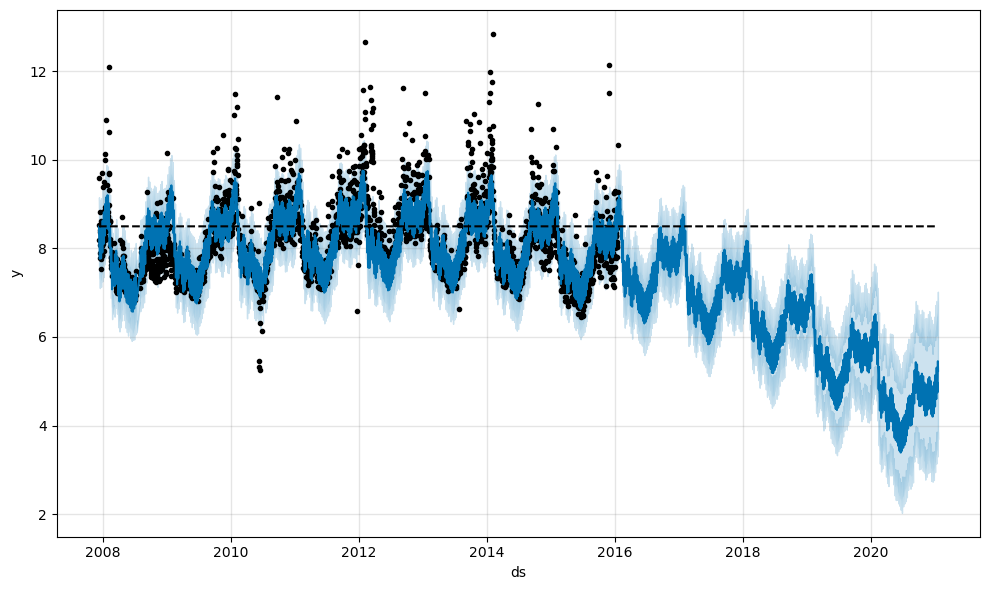

In [13]:
future = m.make_future_dataframe(periods=1826)
future['cap'] = 8.5
fcst = m.predict(future)
fig = m.plot(fcst)

### Saturating Minimum

09:56:48 - cmdstanpy - INFO - Chain [1] start processing
09:56:48 - cmdstanpy - INFO - Chain [1] done processing


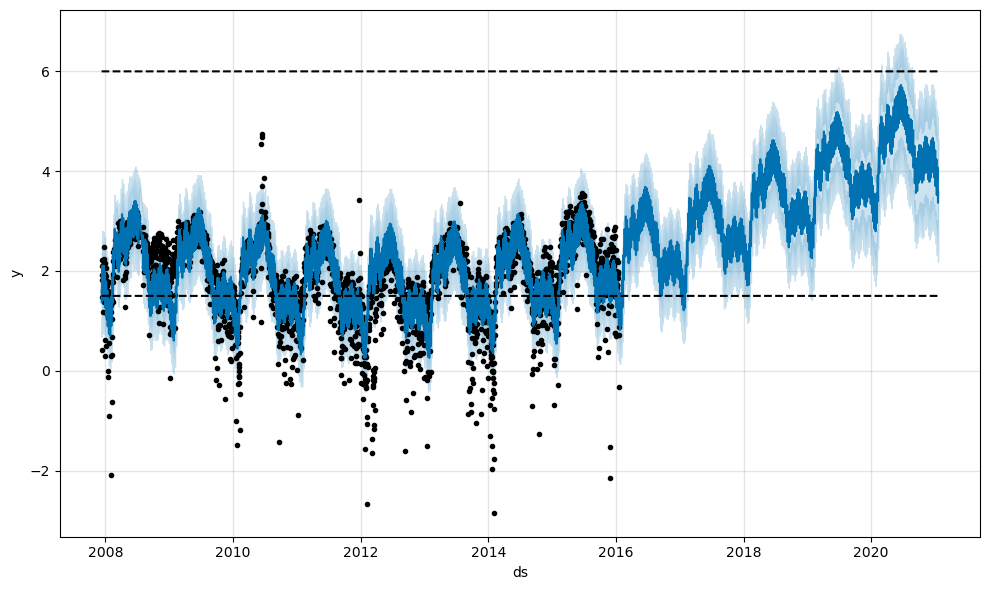

In [14]:
df['y'] = 10 - df['y']
df['cap'] = 6
df['floor'] = 1.5
future['cap'] = 6
future['floor'] = 1.5
m = Prophet(growth='logistic')
m.fit(df)
fcst = m.predict(future)
fig = m.plot(fcst)

## Trend Changepoints

### Automatic changepoint detection in Prophet

In [15]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_peyton_manning.csv')
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=365)

09:56:59 - cmdstanpy - INFO - Chain [1] start processing
09:56:59 - cmdstanpy - INFO - Chain [1] done processing


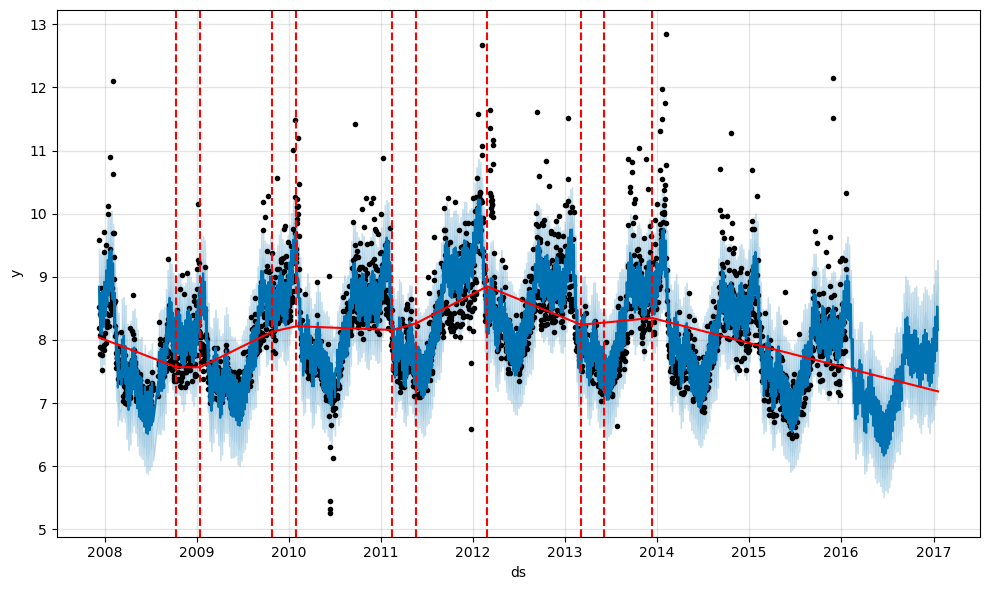

In [16]:
from prophet.plot import add_changepoints_to_plot


fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)


### Adjusting trend flexibility

09:57:00 - cmdstanpy - INFO - Chain [1] start processing
09:57:01 - cmdstanpy - INFO - Chain [1] done processing


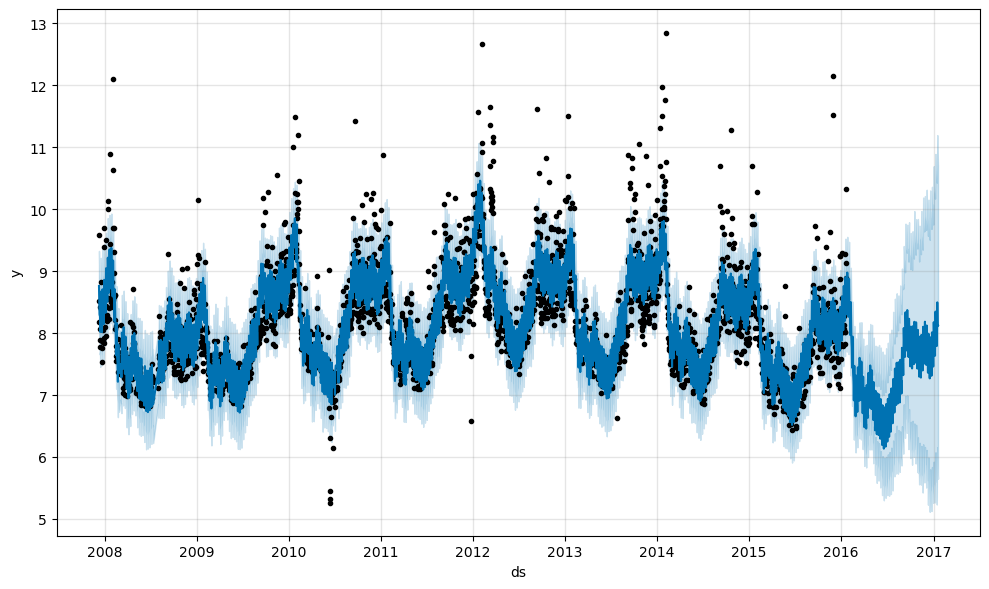

In [17]:
m = Prophet(changepoint_prior_scale=0.5)
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)

09:57:02 - cmdstanpy - INFO - Chain [1] start processing
09:57:02 - cmdstanpy - INFO - Chain [1] done processing


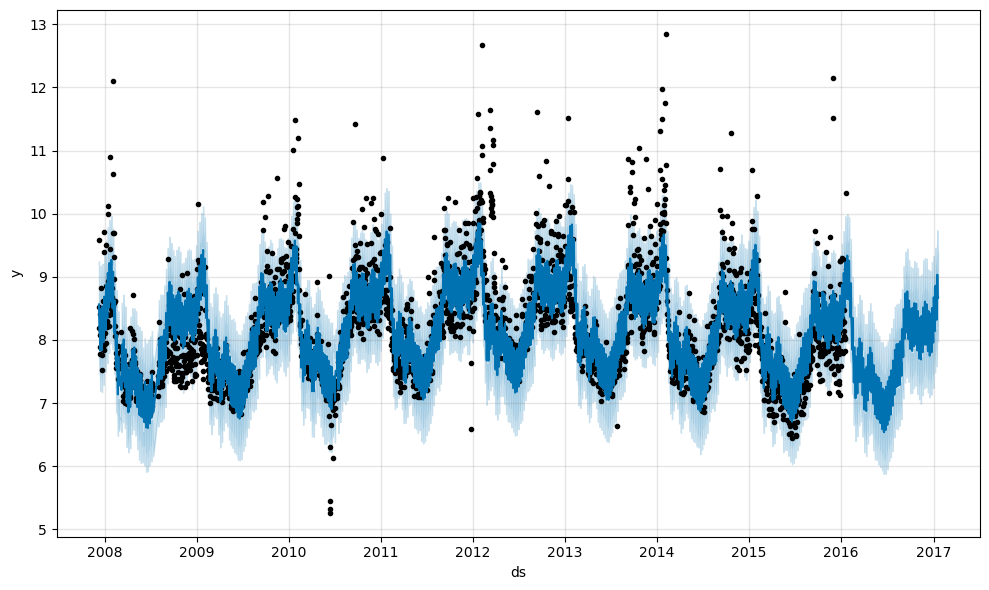

In [18]:
m = Prophet(changepoint_prior_scale=0.001)
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)

### Specifying the locations of the changepoints

09:57:03 - cmdstanpy - INFO - Chain [1] start processing
09:57:03 - cmdstanpy - INFO - Chain [1] done processing


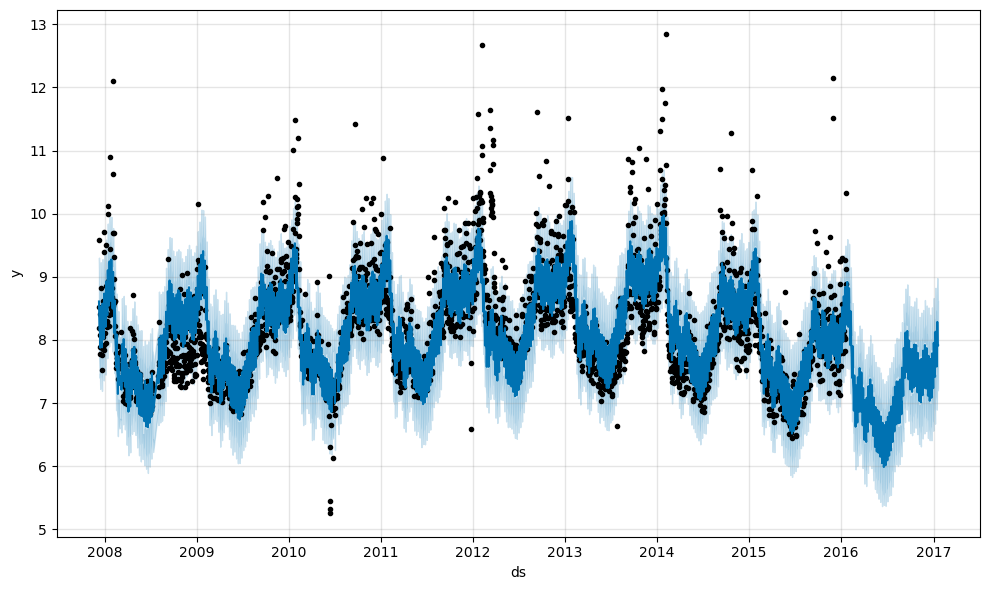

In [19]:
m = Prophet(changepoints=['2014-01-01'])
forecast = m.fit(df).predict(future)
fig = m.plot(forecast)

## Seasonality, Holiday Effects, And Regressors

### Modeling Holidays and Special Events

In [20]:
playoffs = pd.DataFrame({
  'holiday': 'playoff',
  'ds': pd.to_datetime(['2008-01-13', '2009-01-03', '2010-01-16',
                        '2010-01-24', '2010-02-07', '2011-01-08',
                        '2013-01-12', '2014-01-12', '2014-01-19',
                        '2014-02-02', '2015-01-11', '2016-01-17',
                        '2016-01-24', '2016-02-07']),
  'lower_window': 0,
  'upper_window': 1,
})
superbowls = pd.DataFrame({
  'holiday': 'superbowl',
  'ds': pd.to_datetime(['2010-02-07', '2014-02-02', '2016-02-07']),
  'lower_window': 0,
  'upper_window': 1,
})
holidays = pd.concat((playoffs, superbowls))

In [21]:
m = Prophet(holidays=holidays)
forecast = m.fit(df).predict(future)

09:57:04 - cmdstanpy - INFO - Chain [1] start processing
09:57:04 - cmdstanpy - INFO - Chain [1] done processing


In [22]:
forecast[(forecast['playoff'] + forecast['superbowl']).abs() > 0][
        ['ds', 'playoff', 'superbowl']][-10:]

,ds,playoff,superbowl
2190,2014-02-02,1.228031,1.201321
2191,2014-02-03,1.901884,1.451541
2532,2015-01-11,1.228031,0.000000
2533,2015-01-12,1.901884,0.000000
2901,2016-01-17,1.228031,0.000000
2902,2016-01-18,1.901884,0.000000
2908,2016-01-24,1.228031,0.000000
2909,2016-01-25,1.901884,0.000000
2922,2016-02-07,1.228031,1.201321
2923,2016-02-08,1.901884,1.451541


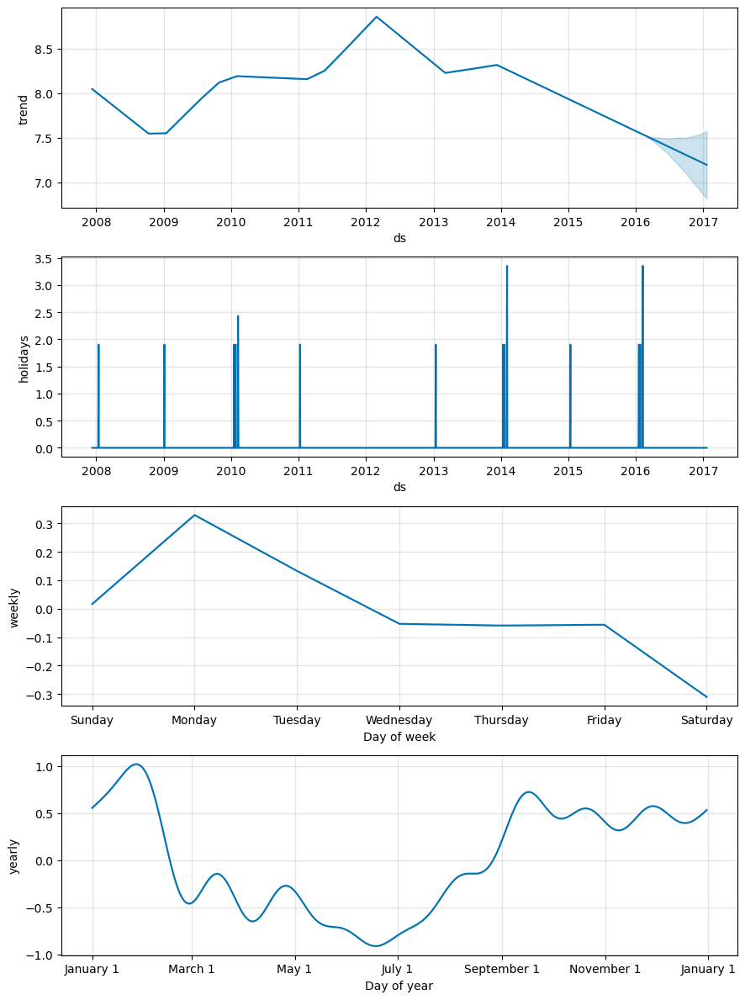

In [23]:
fig = m.plot_components(forecast)


### Built-in Country Holidays

In [24]:
m = Prophet(holidays=holidays)
m.add_country_holidays(country_name='US')
m.fit(df)

09:57:06 - cmdstanpy - INFO - Chain [1] start processing
09:57:06 - cmdstanpy - INFO - Chain [1] done processing


In [25]:
m.train_holiday_names


0                         playoff
1                       superbowl
2                  New Year's Day
3                    Memorial Day
4                Independence Day
5                       Labor Day
6                    Veterans Day
7                    Thanksgiving
8                   Christmas Day
9        Christmas Day (observed)
10     Martin Luther King Jr. Day
11          Washington's Birthday
12                   Columbus Day
13        Veterans Day (observed)
14    Independence Day (observed)
15      New Year's Day (observed)
dtype: object

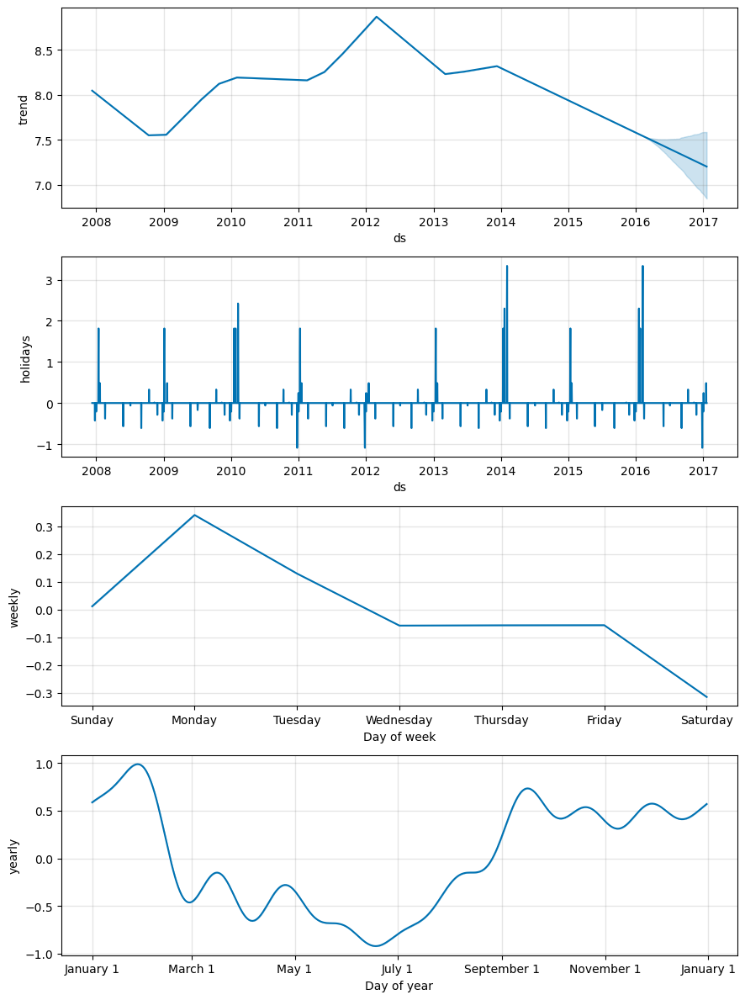

In [26]:
forecast = m.predict(future)
fig = m.plot_components(forecast)


### Holidays for subdivisions (Python)

In [27]:
from prophet.make_holidays import make_holidays_df

nsw_holidays = make_holidays_df(
    year_list=[2019 + i for i in range(10)], country='AU', province='NSW'
)
nsw_holidays.head(n=10)

,ds,holiday
0,2019-01-01,New Year's Day
1,2019-04-19,Good Friday
2,2019-04-22,Easter Monday
3,2019-12-25,Christmas Day
4,2019-01-26,Australia Day
5,2019-01-28,Australia Day (observed)
6,2019-04-25,Anzac Day
7,2019-12-26,Boxing Day
8,2019-04-20,Easter Saturday
9,2019-04-21,Easter Sunday


In [28]:
from prophet import Prophet

m_nsw = Prophet(holidays=nsw_holidays)


### Fourier Order for Seasonalities

09:57:08 - cmdstanpy - INFO - Chain [1] start processing
09:57:08 - cmdstanpy - INFO - Chain [1] done processing


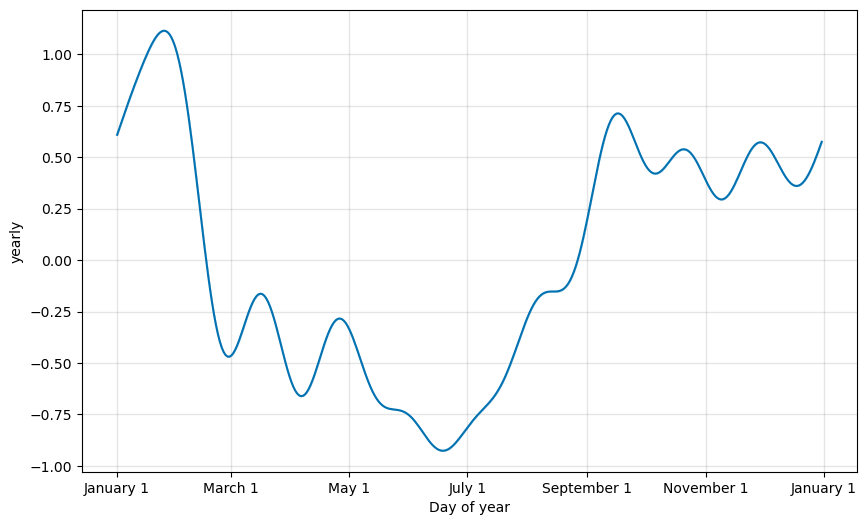

In [29]:
from prophet.plot import plot_yearly
m = Prophet().fit(df)
a = plot_yearly(m)

09:57:09 - cmdstanpy - INFO - Chain [1] start processing
09:57:09 - cmdstanpy - INFO - Chain [1] done processing


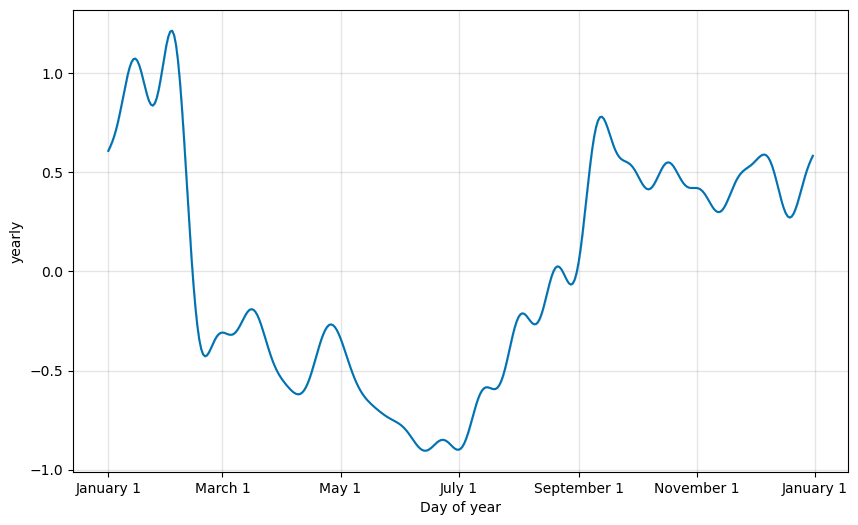

In [30]:
from prophet.plot import plot_yearly
m = Prophet(yearly_seasonality=20).fit(df)
a = plot_yearly(m)

### Specifying Custom Seasonalities

09:57:10 - cmdstanpy - INFO - Chain [1] start processing
09:57:10 - cmdstanpy - INFO - Chain [1] done processing


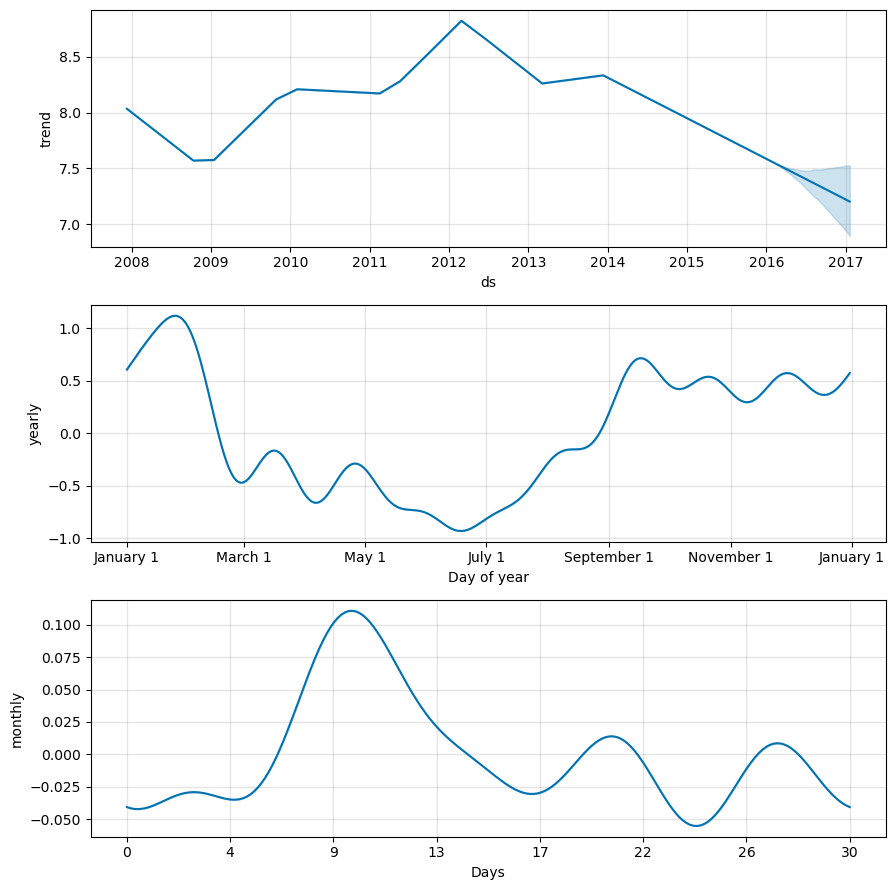

In [31]:
m = Prophet(weekly_seasonality=False)
m.add_seasonality(name='monthly', period=30.5, fourier_order=5)
forecast = m.fit(df).predict(future)
fig = m.plot_components(forecast)

### Seasonalities that depend on other factors

In [32]:
def is_nfl_season(ds):
    date = pd.to_datetime(ds)
    return (date.month > 8 or date.month < 2)

df['on_season'] = df['ds'].apply(is_nfl_season)
df['off_season'] = ~df['ds'].apply(is_nfl_season)


09:57:13 - cmdstanpy - INFO - Chain [1] start processing
09:57:14 - cmdstanpy - INFO - Chain [1] done processing


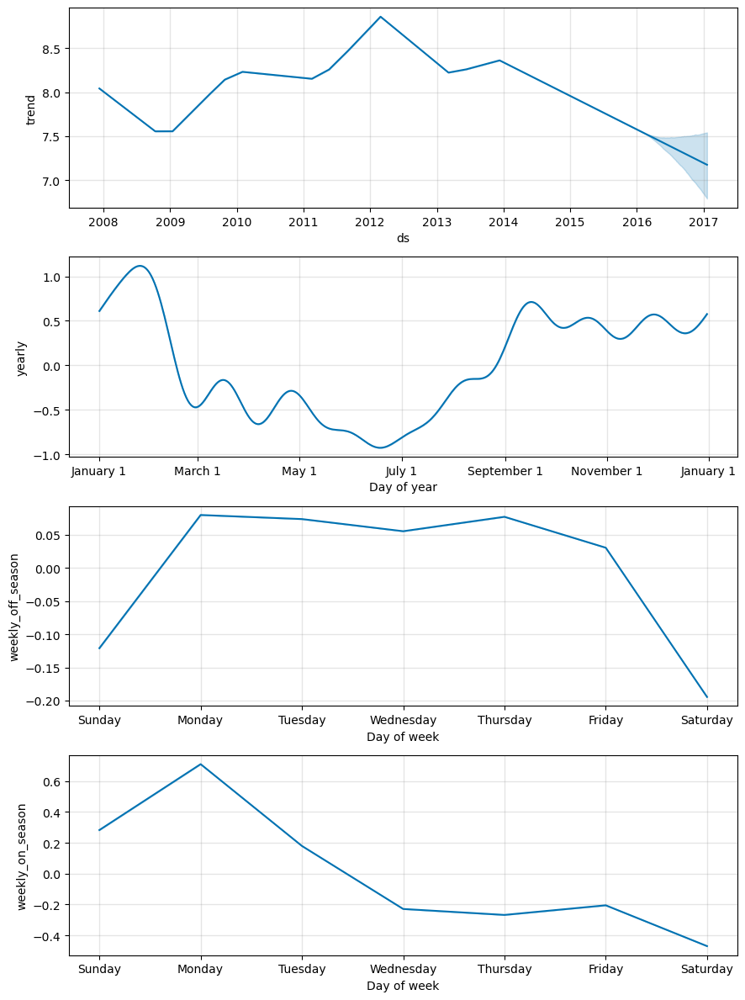

In [33]:
m = Prophet(weekly_seasonality=False)
m.add_seasonality(name='weekly_on_season', period=7, fourier_order=3, condition_name='on_season')
m.add_seasonality(name='weekly_off_season', period=7, fourier_order=3, condition_name='off_season')

future['on_season'] = future['ds'].apply(is_nfl_season)
future['off_season'] = ~future['ds'].apply(is_nfl_season)
forecast = m.fit(df).predict(future)
fig = m.plot_components(forecast)

### Prior scale for holidays and seasonality

In [34]:
m = Prophet(holidays=holidays, holidays_prior_scale=0.05).fit(df)
forecast = m.predict(future)
forecast[(forecast['playoff'] + forecast['superbowl']).abs() > 0][
    ['ds', 'playoff', 'superbowl']][-10:]

09:57:15 - cmdstanpy - INFO - Chain [1] start processing
09:57:16 - cmdstanpy - INFO - Chain [1] done processing


,ds,playoff,superbowl
2190,2014-02-02,1.214551,0.964552
2191,2014-02-03,1.846591,0.991288
2532,2015-01-11,1.214551,0.000000
2533,2015-01-12,1.846591,0.000000
2901,2016-01-17,1.214551,0.000000
2902,2016-01-18,1.846591,0.000000
2908,2016-01-24,1.214551,0.000000
2909,2016-01-25,1.846591,0.000000
2922,2016-02-07,1.214551,0.964552
2923,2016-02-08,1.846591,0.991288


In [35]:
m = Prophet()
m.add_seasonality(
    name='weekly', period=7, fourier_order=3, prior_scale=0.1)

### Additional regressors

09:57:17 - cmdstanpy - INFO - Chain [1] start processing
09:57:18 - cmdstanpy - INFO - Chain [1] done processing


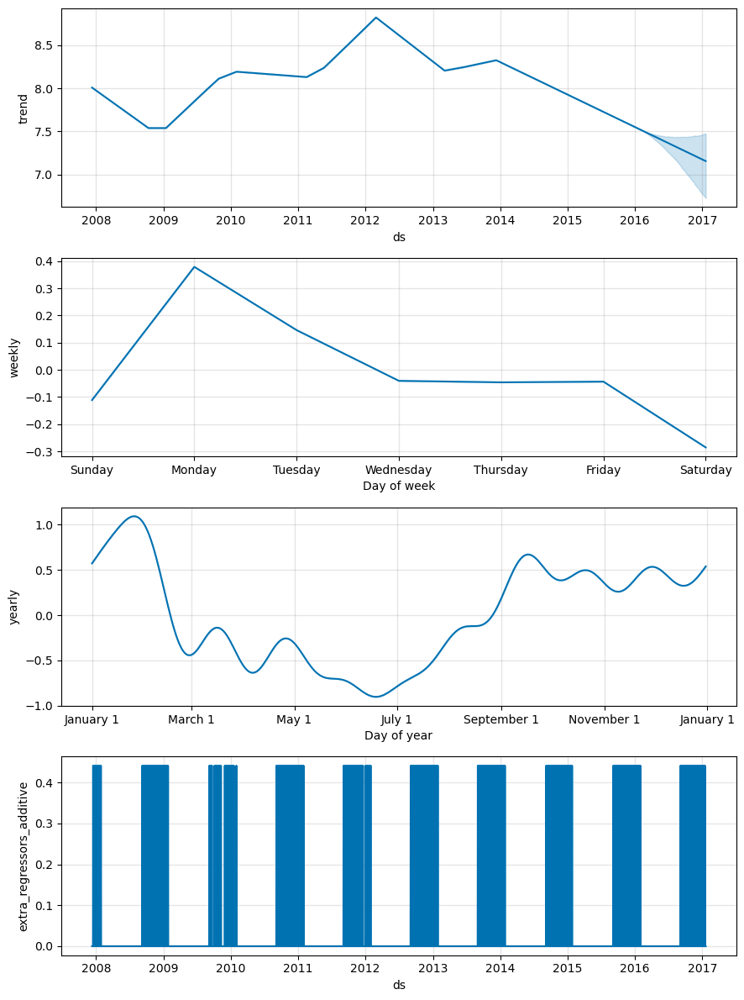

In [36]:
def nfl_sunday(ds):
    date = pd.to_datetime(ds)
    if date.weekday() == 6 and (date.month > 8 or date.month < 2):
        return 1
    else:
        return 0
df['nfl_sunday'] = df['ds'].apply(nfl_sunday)

m = Prophet()
m.add_regressor('nfl_sunday')
m.fit(df)

future['nfl_sunday'] = future['ds'].apply(nfl_sunday)

forecast = m.predict(future)
fig = m.plot_components(forecast)

## Multiplicative Seasonality

09:57:19 - cmdstanpy - INFO - Chain [1] start processing
09:57:19 - cmdstanpy - INFO - Chain [1] done processing


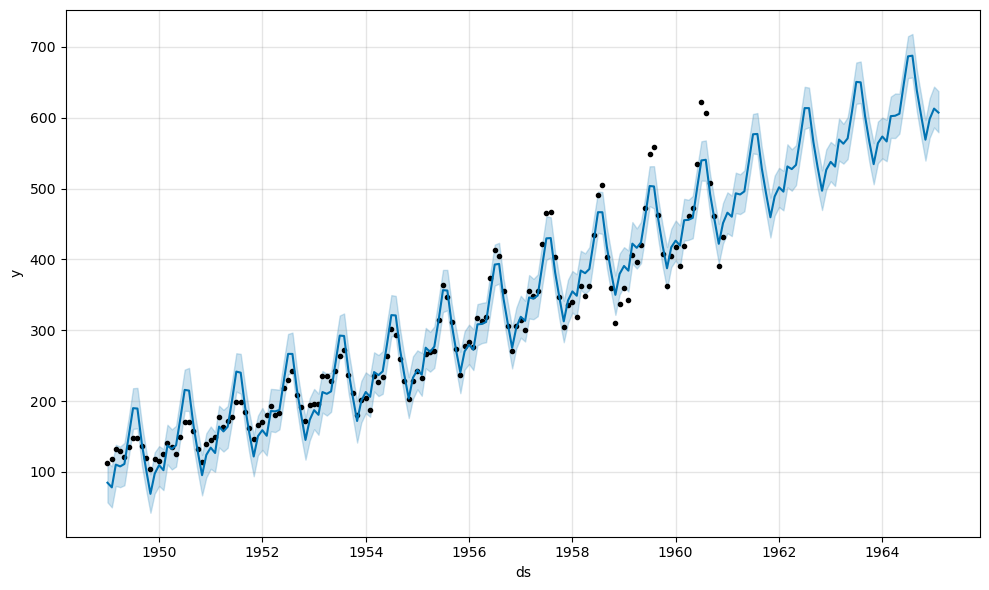

In [37]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_air_passengers.csv')
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(50, freq='MS')
forecast = m.predict(future)
fig = m.plot(forecast)

09:57:20 - cmdstanpy - INFO - Chain [1] start processing
09:57:20 - cmdstanpy - INFO - Chain [1] done processing


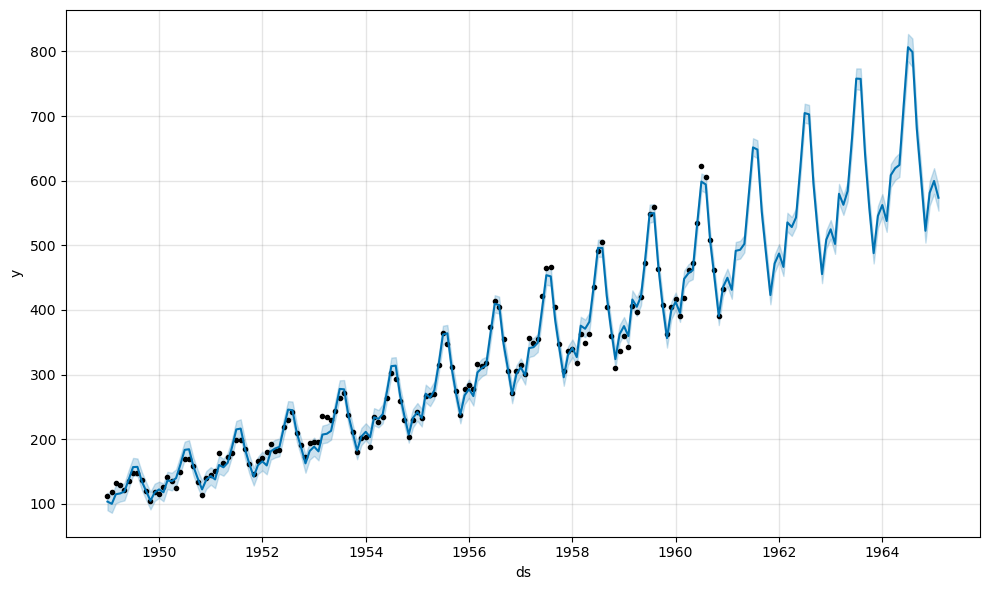

In [38]:
m = Prophet(seasonality_mode='multiplicative')
m.fit(df)
forecast = m.predict(future)
fig = m.plot(forecast)

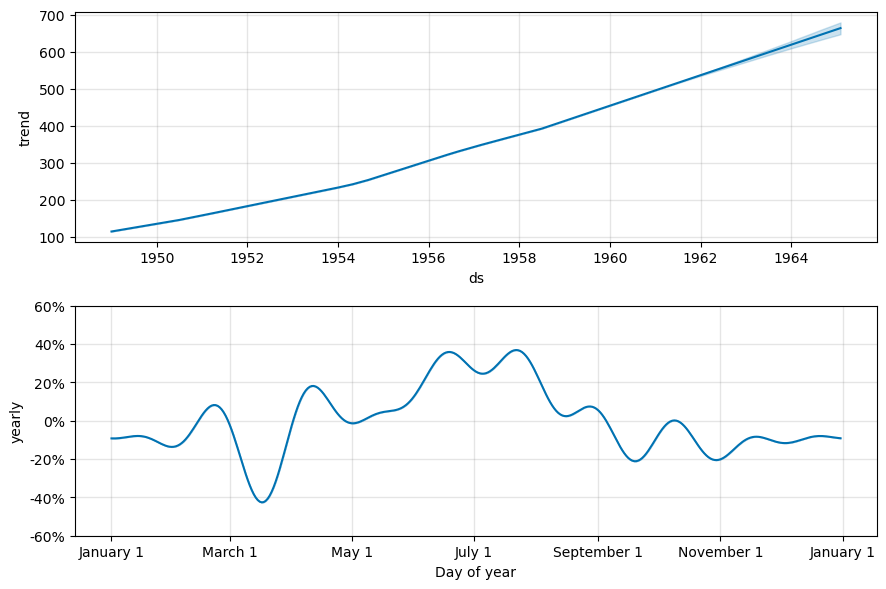

In [39]:
fig = m.plot_components(forecast)


In [40]:
m = Prophet(seasonality_mode='multiplicative')
m.add_seasonality('quarterly', period=91.25, fourier_order=8, mode='additive')
m.add_regressor('regressor', mode='additive')

## Uncertainty Intervals

In [41]:
forecast = Prophet(interval_width=0.95).fit(df).predict(future)

09:57:21 - cmdstanpy - INFO - Chain [1] start processing
09:57:21 - cmdstanpy - INFO - Chain [1] done processing


### Uncertainty in seasonality

In [42]:
m = Prophet(mcmc_samples=300)
forecast = m.fit(df, show_progress=False).predict(future)


09:57:21 - cmdstanpy - INFO - CmdStan start processing
09:57:21 - cmdstanpy - INFO - Chain [1] start processing
09:57:21 - cmdstanpy - INFO - Chain [2] start processing
09:57:21 - cmdstanpy - INFO - Chain [3] start processing
09:57:21 - cmdstanpy - INFO - Chain [4] start processing
09:57:22 - cmdstanpy - INFO - Chain [2] done processing
09:57:23 - cmdstanpy - INFO - Chain [3] done processing
09:57:23 - cmdstanpy - INFO - Chain [1] done processing
09:57:23 - cmdstanpy - INFO - Chain [4] done processing
09:57:23 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
Exce

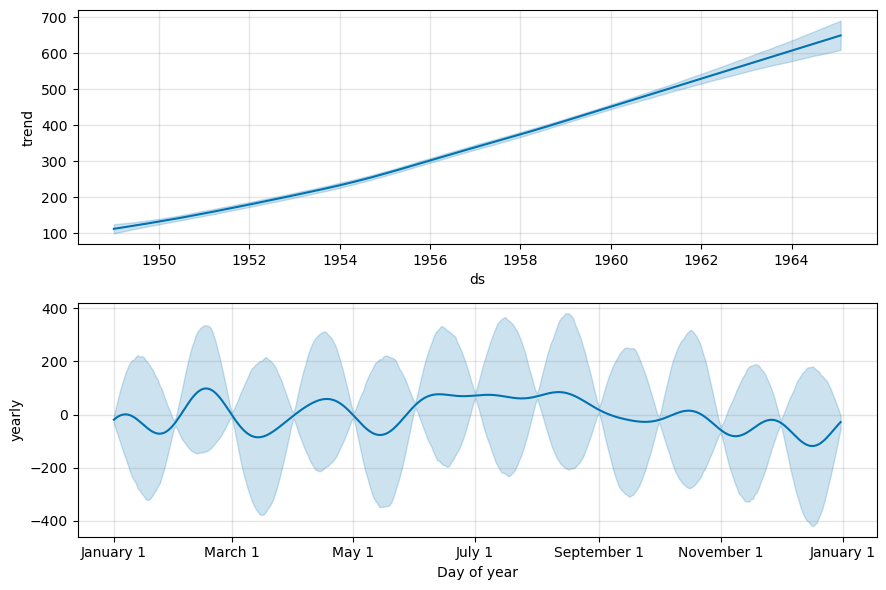

In [43]:
fig = m.plot_components(forecast)


## Outliers

09:57:24 - cmdstanpy - INFO - Chain [1] start processing
09:57:26 - cmdstanpy - INFO - Chain [1] done processing


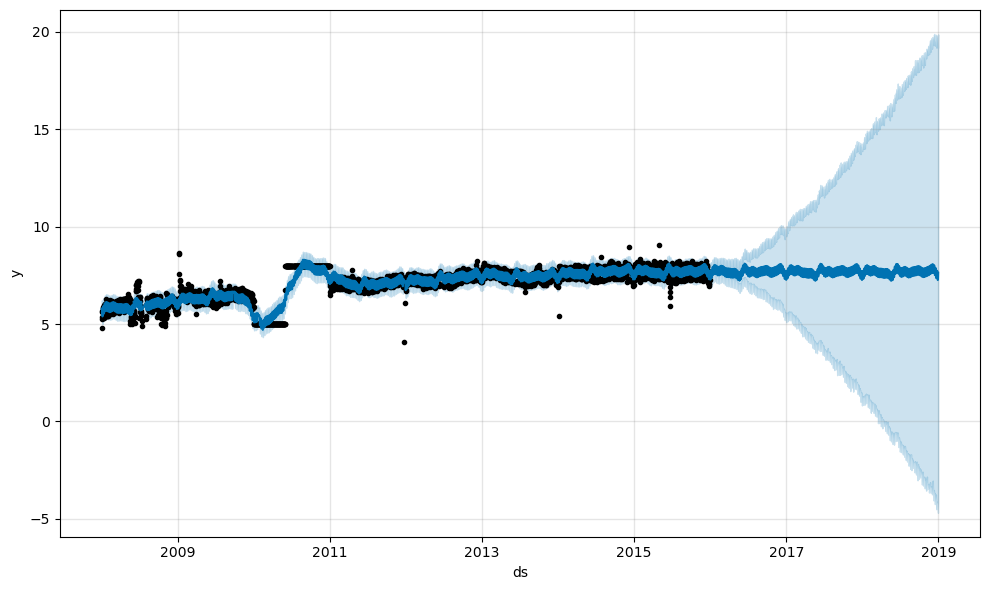

In [44]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_R_outliers1.csv')
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=1096)
forecast = m.predict(future)
fig = m.plot(forecast)

09:57:27 - cmdstanpy - INFO - Chain [1] start processing
09:57:27 - cmdstanpy - INFO - Chain [1] done processing


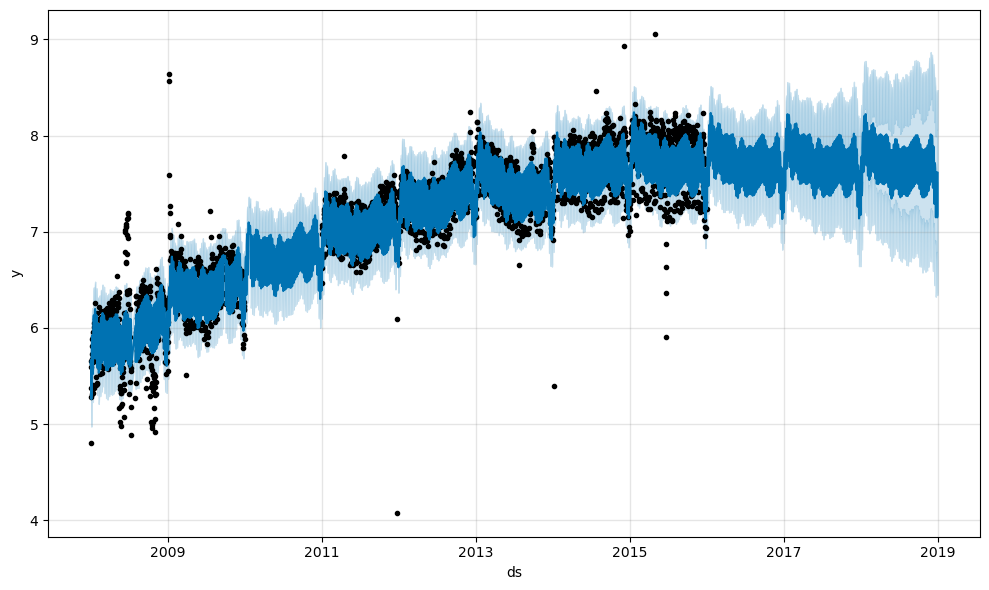

In [45]:
df.loc[(df['ds'] > '2010-01-01') & (df['ds'] < '2011-01-01'), 'y'] = None
model = Prophet().fit(df)
fig = model.plot(model.predict(future))

09:57:28 - cmdstanpy - INFO - Chain [1] start processing
09:57:29 - cmdstanpy - INFO - Chain [1] done processing


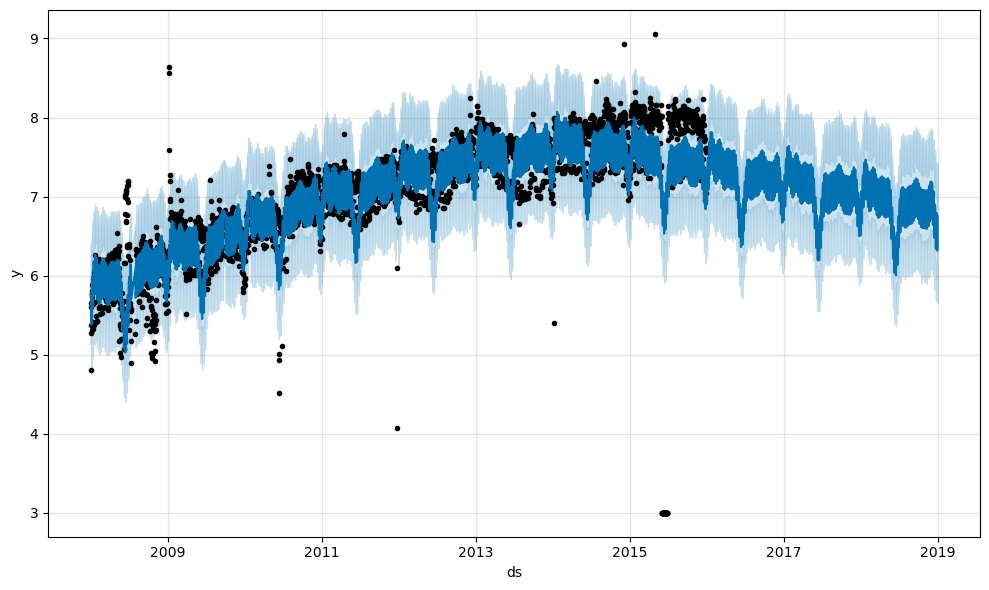

In [46]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_R_outliers2.csv')
m = Prophet()
m.fit(df)
future = m.make_future_dataframe(periods=1096)
forecast = m.predict(future)
fig = m.plot(forecast)

09:57:30 - cmdstanpy - INFO - Chain [1] start processing
09:57:30 - cmdstanpy - INFO - Chain [1] done processing


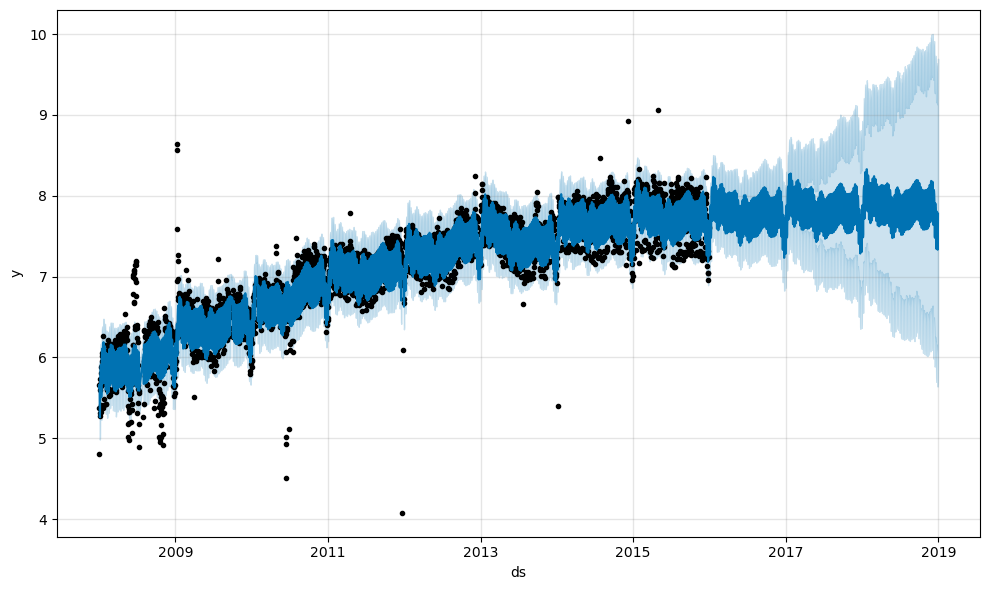

In [47]:
df.loc[(df['ds'] > '2015-06-01') & (df['ds'] < '2015-06-30'), 'y'] = None
m = Prophet().fit(df)
fig = m.plot(m.predict(future))

## Non-Daily Data

### Sub-daily data

09:57:33 - cmdstanpy - INFO - Chain [1] start processing
09:57:36 - cmdstanpy - INFO - Chain [1] done processing


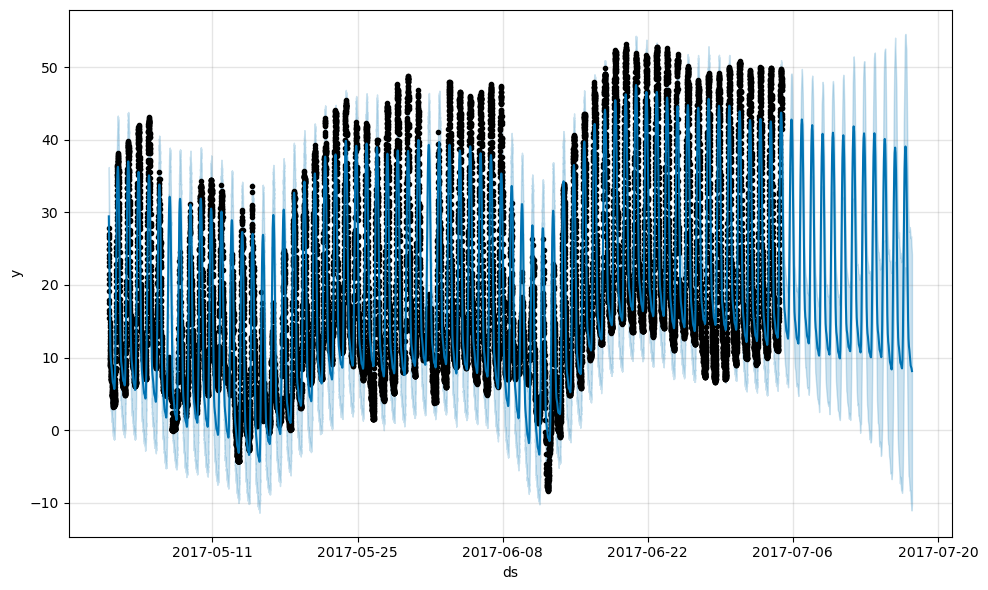

In [48]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_yosemite_temps.csv')
m = Prophet(changepoint_prior_scale=0.01).fit(df)
future = m.make_future_dataframe(periods=300, freq='H')
fcst = m.predict(future)
fig = m.plot(fcst)

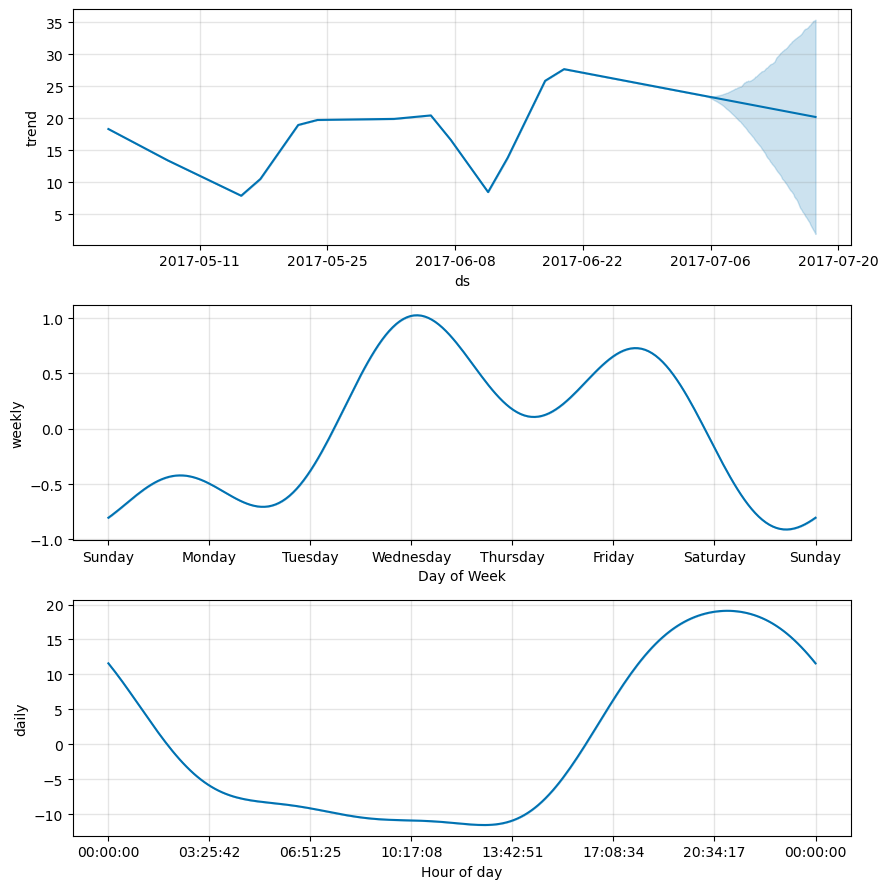

In [49]:
fig = m.plot_components(fcst)

### Monthly data

09:57:40 - cmdstanpy - INFO - Chain [1] start processing
09:57:40 - cmdstanpy - INFO - Chain [1] done processing


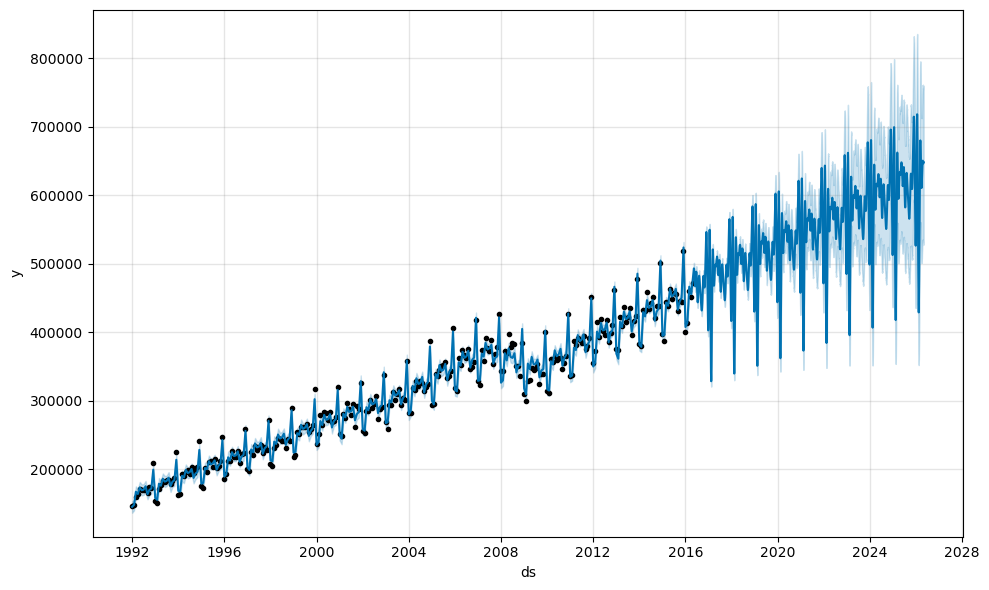

In [50]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_retail_sales.csv')
m = Prophet(seasonality_mode='multiplicative').fit(df)
future = m.make_future_dataframe(periods=3652)
fcst = m.predict(future)
fig = m.plot(fcst)

09:57:41 - cmdstanpy - INFO - CmdStan start processing
09:57:41 - cmdstanpy - INFO - Chain [1] start processing
09:57:41 - cmdstanpy - INFO - Chain [2] start processing
09:57:41 - cmdstanpy - INFO - Chain [3] start processing
09:57:41 - cmdstanpy - INFO - Chain [4] start processing
09:57:49 - cmdstanpy - INFO - Chain [4] done processing
09:57:50 - cmdstanpy - INFO - Chain [2] done processing
09:57:50 - cmdstanpy - INFO - Chain [1] done processing
09:57:50 - cmdstanpy - INFO - Chain [3] done processing
09:57:50 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_glm_lpdf: Matrix of independent variables is inf, but must be finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', line 137, column 2 to line 142, c

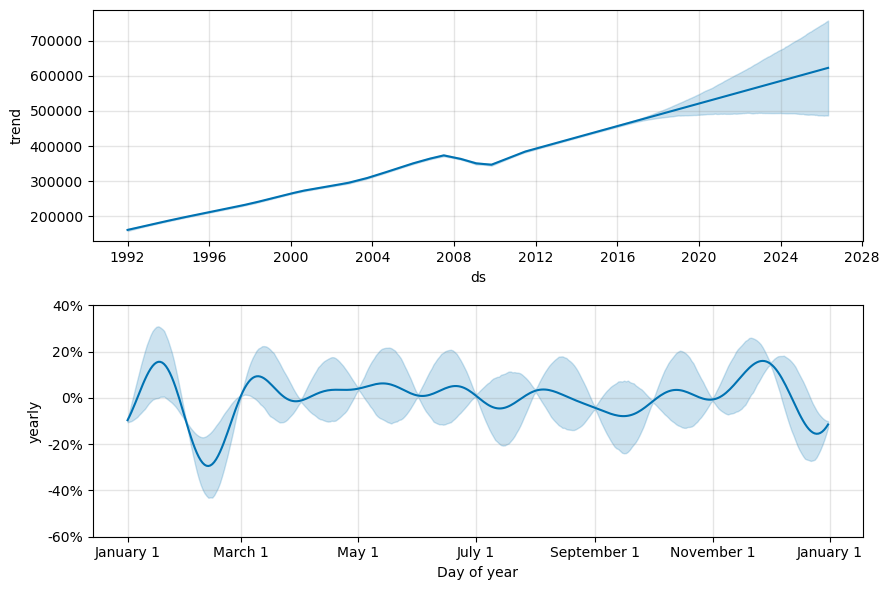

In [51]:
m = Prophet(seasonality_mode='multiplicative', mcmc_samples=300).fit(df, show_progress=False)
fcst = m.predict(future)
fig = m.plot_components(fcst)

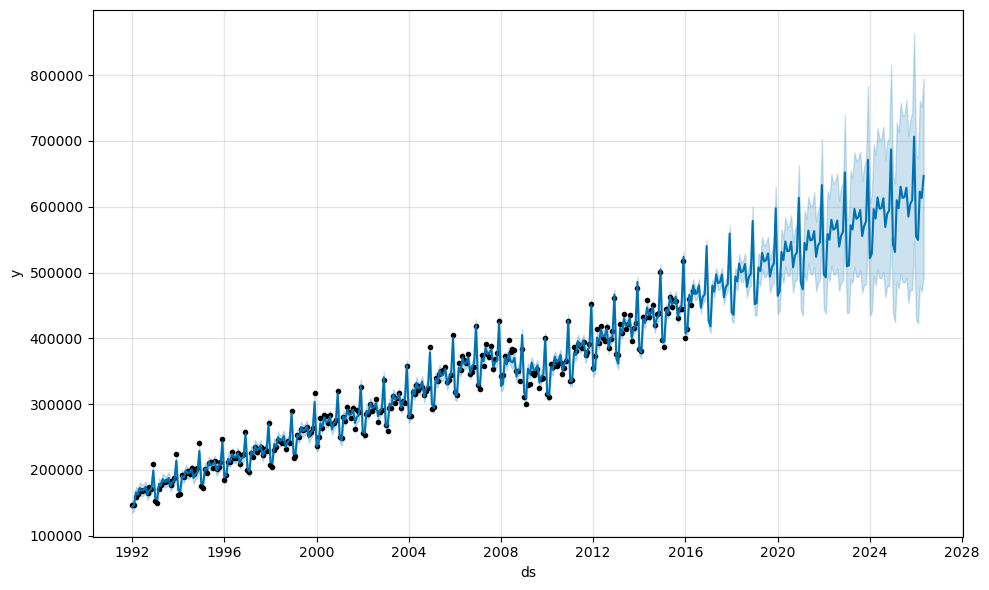

In [52]:
future = m.make_future_dataframe(periods=120, freq='MS')
fcst = m.predict(future)
fig = m.plot(fcst)

## Diagnostics

### Cross validation

In [56]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_wp_log_peyton_manning.csv')
m = Prophet()
m.fit(df)

10:03:47 - cmdstanpy - INFO - Chain [1] start processing
10:03:47 - cmdstanpy - INFO - Chain [1] done processing


In [57]:
from prophet.diagnostics import cross_validation
df_cv = cross_validation(m, initial='730 days', period='180 days', horizon = '365 days')

  0%|          | 0/11 [00:00<?, ?it/s]

10:03:48 - cmdstanpy - INFO - Chain [1] start processing
10:03:48 - cmdstanpy - INFO - Chain [1] done processing
10:03:49 - cmdstanpy - INFO - Chain [1] start processing
10:03:49 - cmdstanpy - INFO - Chain [1] done processing
10:03:49 - cmdstanpy - INFO - Chain [1] start processing
10:03:49 - cmdstanpy - INFO - Chain [1] done processing
10:03:49 - cmdstanpy - INFO - Chain [1] start processing
10:03:50 - cmdstanpy - INFO - Chain [1] done processing
10:03:50 - cmdstanpy - INFO - Chain [1] start processing
10:03:50 - cmdstanpy - INFO - Chain [1] done processing
10:03:50 - cmdstanpy - INFO - Chain [1] start processing
10:03:50 - cmdstanpy - INFO - Chain [1] done processing
10:03:51 - cmdstanpy - INFO - Chain [1] start processing
10:03:51 - cmdstanpy - INFO - Chain [1] done processing
10:03:51 - cmdstanpy - INFO - Chain [1] start processing
10:03:52 - cmdstanpy - INFO - Chain [1] done processing
10:03:52 - cmdstanpy - INFO - Chain [1] start processing
10:03:52 - cmdstanpy - INFO - Chain [1]

In [60]:
df_cv[:5]

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2010-02-16,8.953435,8.482599,9.436993,8.242493,2010-02-15
1,2010-02-17,8.719763,8.239303,9.204673,8.008033,2010-02-15
2,2010-02-18,8.603390,8.082291,9.084688,8.045268,2010-02-15
3,2010-02-19,8.525158,8.011622,9.018603,7.928766,2010-02-15
4,2010-02-20,8.266980,7.757916,8.777302,7.745003,2010-02-15


In [65]:
df_cv[350:370]

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
350,2011-02-09,10.468342,9.925019,11.003367,8.283241,2010-02-15
351,2011-02-10,10.356705,9.815377,10.906384,8.273337,2010-02-15
352,2011-02-11,10.275750,9.726405,10.799148,8.159089,2010-02-15
353,2011-02-12,10.007474,9.424543,10.556970,7.913521,2010-02-15
354,2011-02-13,10.321348,9.775799,10.875992,7.840706,2010-02-15
355,2011-02-14,10.524076,9.996266,11.076352,8.024862,2010-02-15
356,2011-02-15,10.224746,9.711617,10.742546,7.971431,2010-02-15
357,2010-08-15,7.759396,7.254218,8.306399,8.307706,2010-08-14
358,2010-08-16,8.015835,7.481614,8.514067,8.280711,2010-08-14
359,2010-08-17,7.837910,7.321790,8.344459,8.744488,2010-08-14


In [63]:
cutoffs = pd.to_datetime(['2013-02-15', '2013-08-15', '2014-02-15'])
df_cv2 = cross_validation(m, cutoffs=cutoffs, horizon='365 days')

  0%|          | 0/3 [00:00<?, ?it/s]

10:06:42 - cmdstanpy - INFO - Chain [1] start processing
10:06:42 - cmdstanpy - INFO - Chain [1] done processing
10:06:43 - cmdstanpy - INFO - Chain [1] start processing
10:06:43 - cmdstanpy - INFO - Chain [1] done processing
10:06:43 - cmdstanpy - INFO - Chain [1] start processing
10:06:44 - cmdstanpy - INFO - Chain [1] done processing


In [66]:
from prophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,smape,coverage
0,37 days,0.492508,0.701789,0.503905,0.058375,0.049842,0.058677,0.681590
1,38 days,0.498292,0.705898,0.508875,0.058950,0.049569,0.059311,0.681590
2,39 days,0.520423,0.721404,0.514952,0.059547,0.049609,0.060034,0.680219
3,40 days,0.527610,0.726368,0.517812,0.059852,0.049504,0.060408,0.683874
4,41 days,0.534954,0.731406,0.518778,0.059928,0.049569,0.060547,0.691412


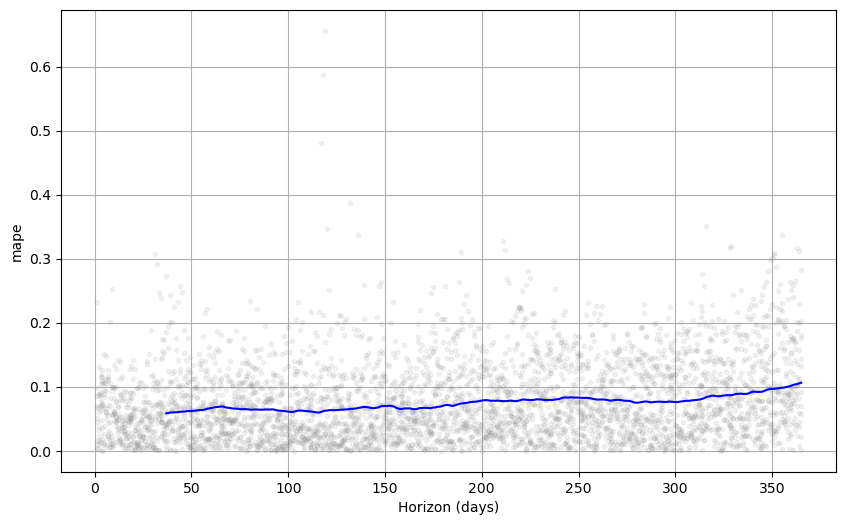

In [67]:
from prophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='mape')

### Hyperparameter tuning

In [71]:
import itertools
import numpy as np
import pandas as pd

param_grid = {  
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(df)  # Fit model with given params
    df_cv = cross_validation(m, cutoffs=cutoffs, horizon='30 days', parallel="processes")
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['mape'].values[0])

# Find the best parameters
tuning_results = pd.DataFrame(all_params)
tuning_results['rmse'] = rmses
print(tuning_results)

11:08:13 - cmdstanpy - INFO - Chain [1] start processing
11:08:15 - cmdstanpy - INFO - Chain [1] done processing


KeyboardInterrupt: 

### Handling Shocks

In [2]:
%matplotlib inline
from prophet import Prophet
import pandas as pd
from matplotlib import pyplot as plt
import logging
logging.getLogger('prophet').setLevel(logging.ERROR)
import warnings
warnings.filterwarnings("ignore")

plt.rcParams['figure.figsize'] = 9, 6

In [3]:
df = pd.read_csv('https://raw.githubusercontent.com/facebook/prophet/main/examples/example_pedestrians_covid.csv')


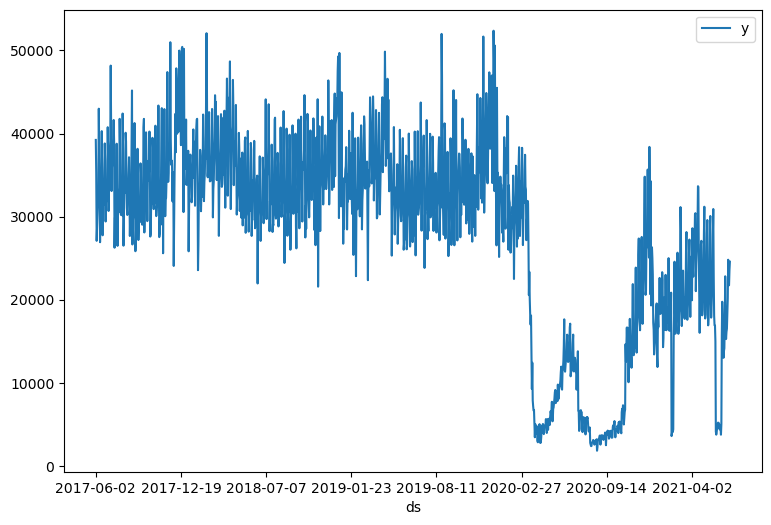

In [4]:
df.set_index('ds').plot();

In [5]:
m = Prophet()
m = m.fit(df)
future = m.make_future_dataframe(periods=366)
forecast = m.predict(future)

15:32:00 - cmdstanpy - INFO - Chain [1] start processing
15:32:00 - cmdstanpy - INFO - Chain [1] done processing


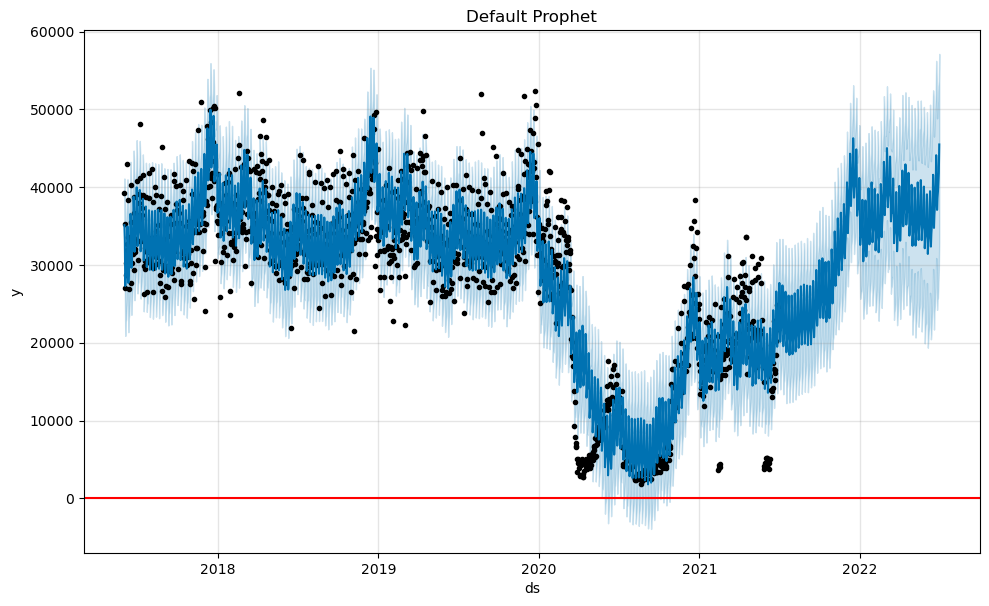

In [6]:
m.plot(forecast)
plt.axhline(y=0, color='red')
plt.title('Default Prophet');


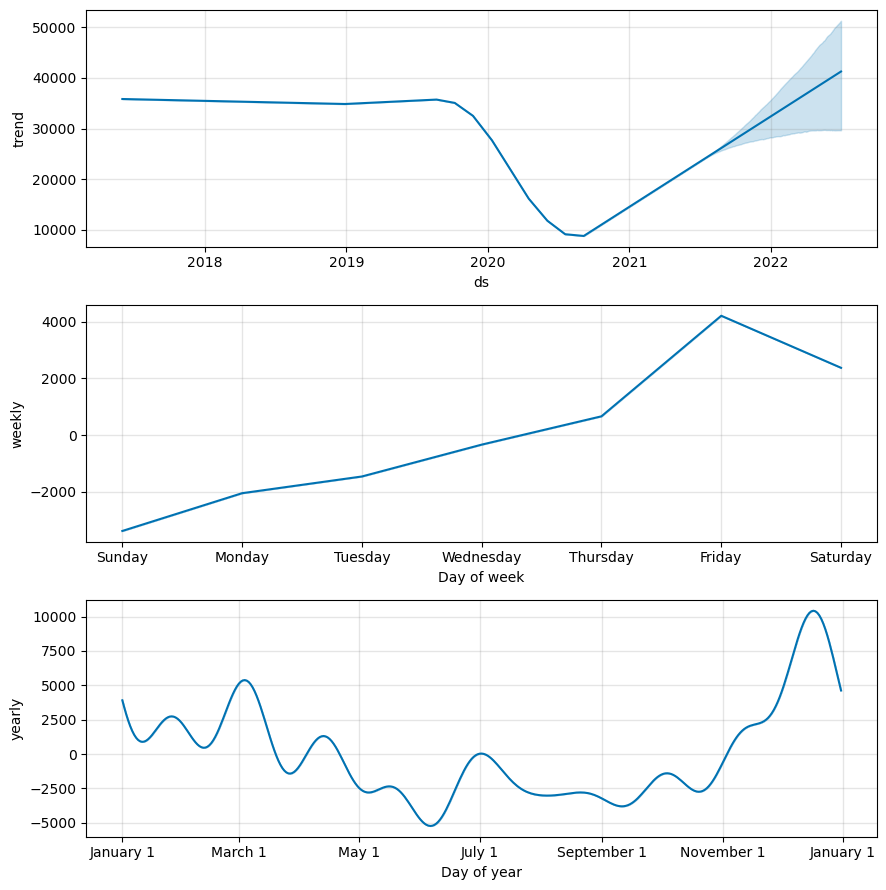

In [7]:
m.plot_components(forecast);

In [8]:
lockdowns = pd.DataFrame([
    {'holiday': 'lockdown_1', 'ds': '2020-03-21', 'lower_window': 0, 'ds_upper': '2020-06-06'},
    {'holiday': 'lockdown_2', 'ds': '2020-07-09', 'lower_window': 0, 'ds_upper': '2020-10-27'},
    {'holiday': 'lockdown_3', 'ds': '2021-02-13', 'lower_window': 0, 'ds_upper': '2021-02-17'},
    {'holiday': 'lockdown_4', 'ds': '2021-05-28', 'lower_window': 0, 'ds_upper': '2021-06-10'},
])
for t_col in ['ds', 'ds_upper']:
    lockdowns[t_col] = pd.to_datetime(lockdowns[t_col])
lockdowns['upper_window'] = (lockdowns['ds_upper'] - lockdowns['ds']).dt.days
lockdowns

,holiday,ds,lower_window,ds_upper,upper_window
0,lockdown_1,2020-03-21,0,2020-06-06,77
1,lockdown_2,2020-07-09,0,2020-10-27,110
2,lockdown_3,2021-02-13,0,2021-02-17,4
3,lockdown_4,2021-05-28,0,2021-06-10,13


In [9]:
m2 = Prophet(holidays=lockdowns)
m2 = m2.fit(df)
future2 = m2.make_future_dataframe(periods=366)
forecast2 = m2.predict(future2)

15:34:53 - cmdstanpy - INFO - Chain [1] start processing
15:34:53 - cmdstanpy - INFO - Chain [1] done processing


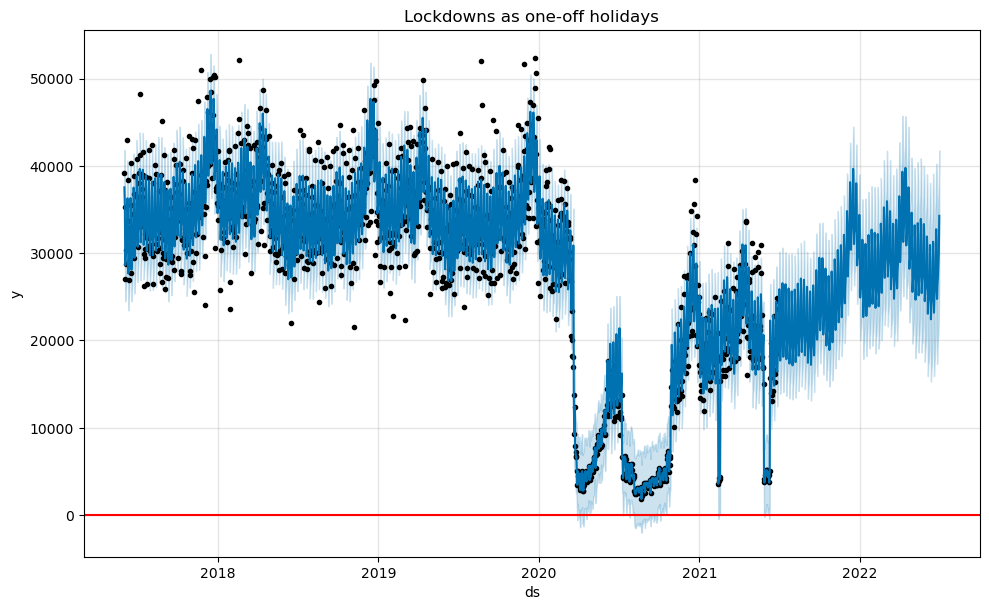

In [10]:
m2.plot(forecast2)
plt.axhline(y=0, color='red')
plt.title('Lockdowns as one-off holidays');

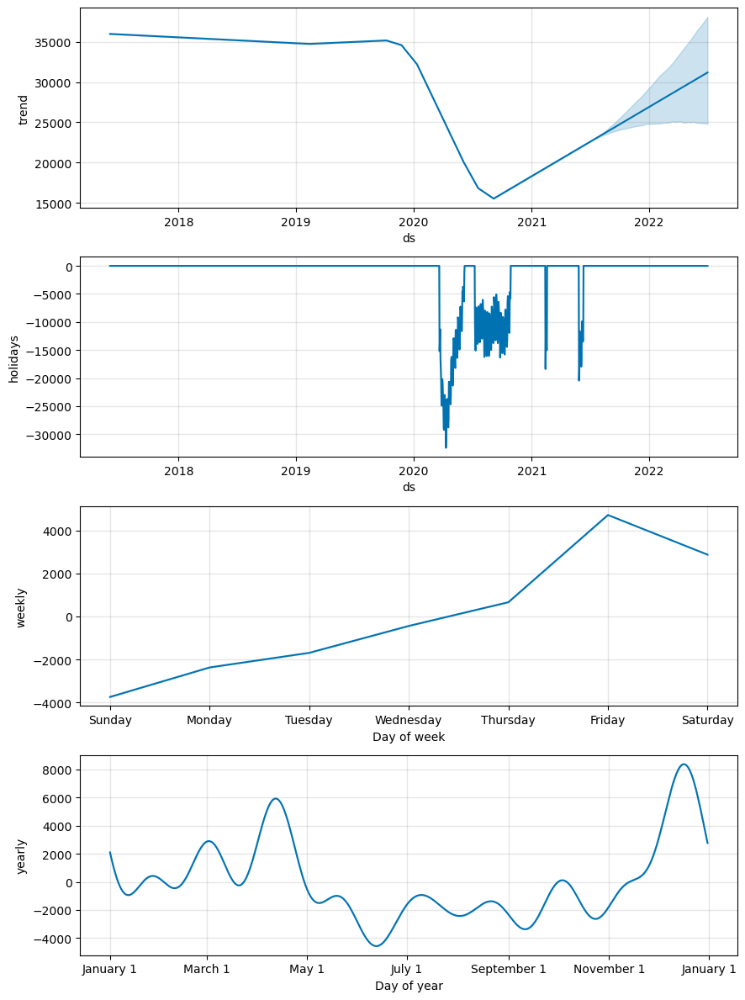

In [11]:
m2.plot_components(forecast2);

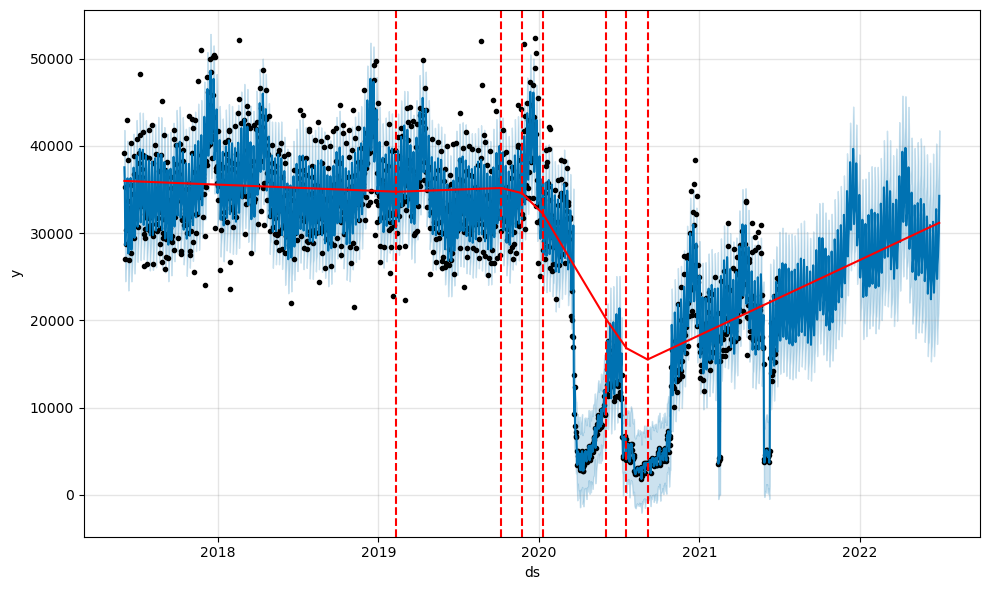

In [12]:
from prophet.plot import add_changepoints_to_plot
fig = m2.plot(forecast2)
a = add_changepoints_to_plot(fig.gca(), m2, forecast2)

In [13]:
m3_changepoints = (
    # 10 potential changepoints in 2.5 years
    pd.date_range('2017-06-02', '2020-01-01', periods=10).date.tolist() + 
    # 15 potential changepoints in 1 year 2 months
    pd.date_range('2020-02-01', '2021-04-01', periods=15).date.tolist()
)

In [14]:
m3 = Prophet(holidays=lockdowns, changepoints=m3_changepoints, changepoint_prior_scale=1.0)
m3 = m3.fit(df)
forecast3 = m3.predict(future2)

15:38:22 - cmdstanpy - INFO - Chain [1] start processing
15:38:23 - cmdstanpy - INFO - Chain [1] done processing


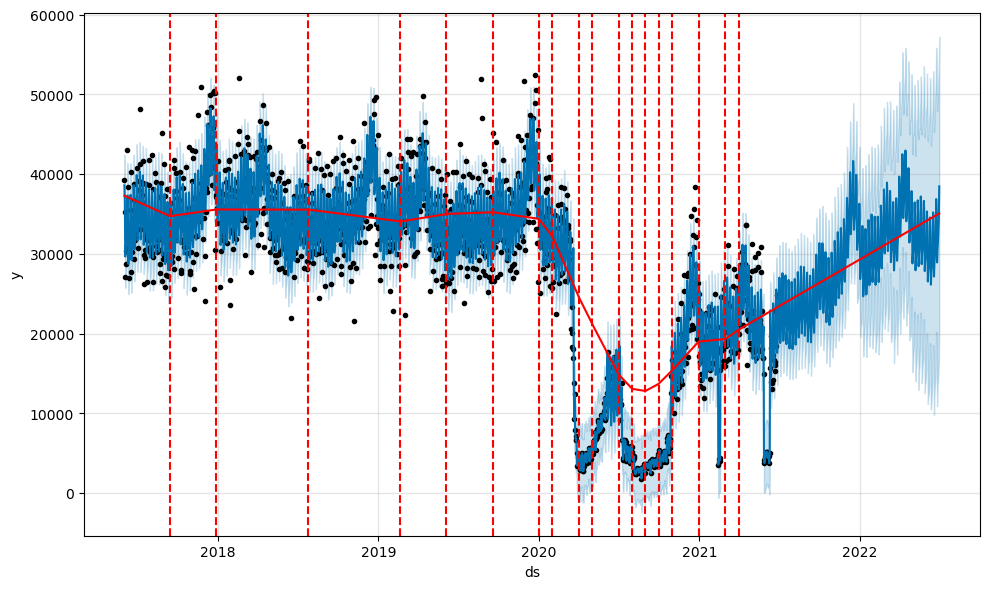

In [15]:
from prophet.plot import add_changepoints_to_plot
fig = m3.plot(forecast3)
a = add_changepoints_to_plot(fig.gca(), m3, forecast3)


In [16]:
df2 = df.copy()
df2['pre_covid'] = pd.to_datetime(df2['ds']) < pd.to_datetime('2020-03-21')
df2['post_covid'] = ~df2['pre_covid']

In [17]:
m4 = Prophet(holidays=lockdowns, weekly_seasonality=False)


In [18]:
m4.add_seasonality(
    name='weekly_pre_covid',
    period=7,
    fourier_order=3,
    condition_name='pre_covid',
)
m4.add_seasonality(
    name='weekly_post_covid',
    period=7,
    fourier_order=3,
    condition_name='post_covid',
);

In [19]:
m4 = m4.fit(df2)


15:42:10 - cmdstanpy - INFO - Chain [1] start processing
15:42:11 - cmdstanpy - INFO - Chain [1] done processing


In [20]:
future4 = m4.make_future_dataframe(periods=366)
future4['pre_covid'] = pd.to_datetime(future4['ds']) < pd.to_datetime('2020-03-21')
future4['post_covid'] = ~future4['pre_covid']

In [21]:
forecast4 = m4.predict(future4)


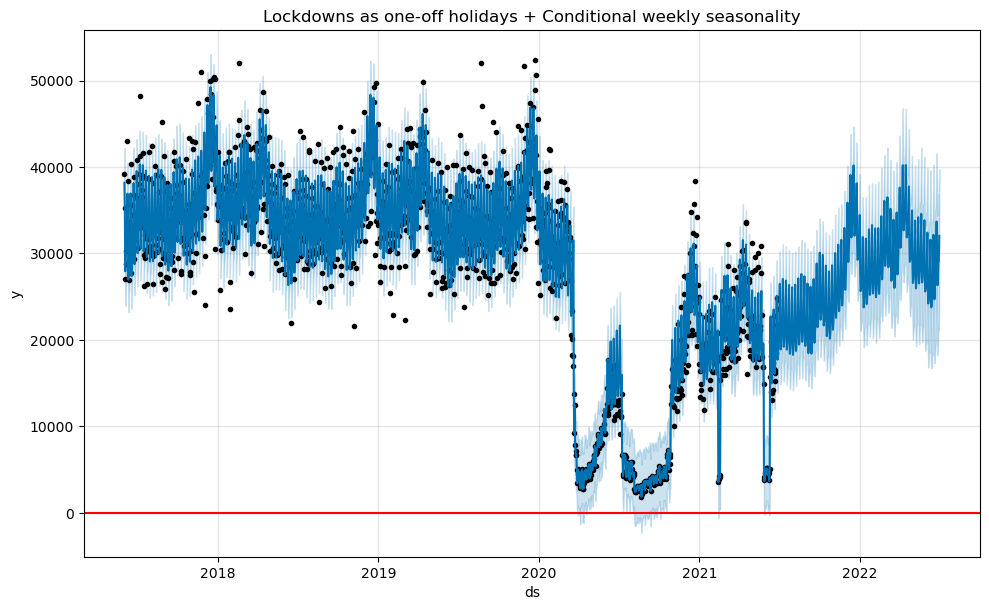

In [22]:
m4.plot(forecast4)
plt.axhline(y=0, color='red')
plt.title('Lockdowns as one-off holidays + Conditional weekly seasonality');

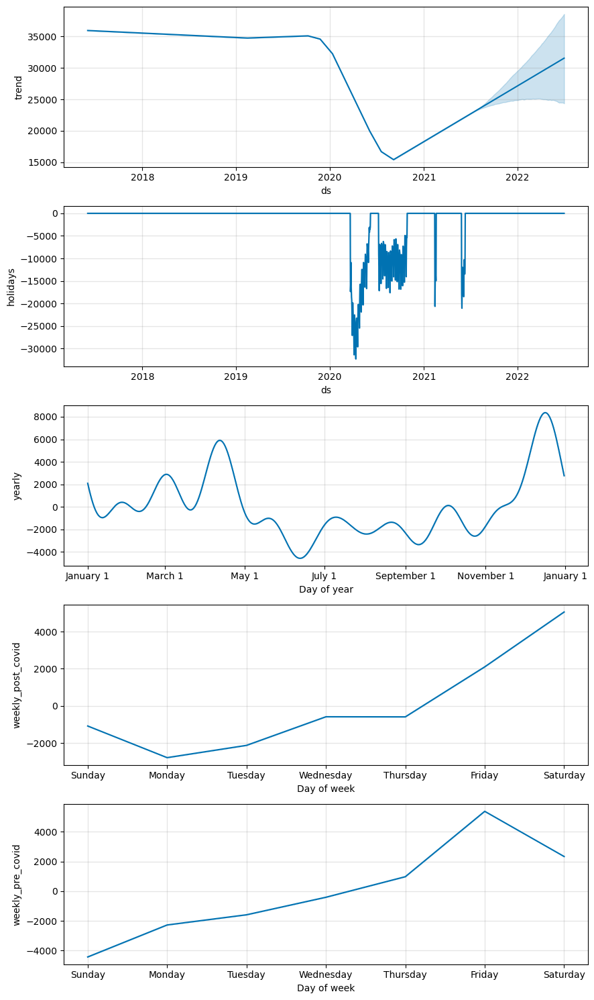

In [23]:
m4.plot_components(forecast4);


### Saving models

In [1]:
from prophet.serialize import model_to_json, model_from_json

with open('serialized_model.json', 'w') as fout:
    fout.write(model_to_json(m))  # Save model

with open('serialized_model.json', 'r') as fin:
    m = model_from_json(fin.read())  # Load model

NameError: name 'm' is not defined